# Import data

In [2]:
import os
from google.colab import drive
drive.mount('/content/drive')
os.chdir('/content/drive/MyDrive/book_recommendation')

Mounted at /content/drive


In [3]:
!git status

On branch main
Changes to be committed:
  (use "git restore --staged <file>..." to unstage)
	modified:   README.md
	deleted:    create_embeddings.ipynb
	new file:   notebooks/create_embeddings.ipynb
	renamed:    extract_interations_subset.ipynb -> notebooks/extract_interations_subset.ipynb
	renamed:    ncf_modeling.ipynb -> notebooks/ncf_modeling.ipynb
	renamed:    ncf_modeling_with_thomas_data.ipynb -> notebooks/ncf_modeling_with_thomas_data.ipynb
	renamed:    thomas_modelling.ipynb -> notebooks/thomas_modelling.ipynb

Changes not staged for commit:
  (use "git add <file>..." to update what will be committed)
  (use "git restore <file>..." to discard changes in working directory)
	modified:   notebooks/create_embeddings.ipynb
	modified:   notebooks/extract_interations_subset.ipynb
	modified:   notebooks/thomas_modelling.ipynb

Untracked files:
  (use "git add <file>..." to include in what will be committed)
	data/



In [8]:
os.getcwd()

'/content/drive/MyDrive/book_recommendation'

In [10]:
gitignore_content = """
# Ignore data folder
data/

# Ignore Jupyter checkpoints
.ipynb_checkpoints/

# Ignore Python cache files
__pycache__/
*.pyc

# Ignore environment and system files
.env
.DS_Store
"""

with open(f'{os.getcwd()}/.gitignore', 'w') as f:
    f.write(gitignore_content.strip())

In [ ]:
# Verified necessary libraries
import gzip
import json
import pandas as pd
import numpy as np

In [ ]:
import pandas as pd
import ijson
import requests
import os
import gzip
import json
import re
import os
import sys
import numpy as np
import pandas as pd
import csv
from sklearn.cluster import KMeans

from collections import defaultdict, Counter

In [ ]:
DIR = './data'
filename = 'goodreads_interactions_2k_users_fantasy_paranormal.json.gz'
file_path = os.path.join(DIR, filename)

with gzip.open(file_path, 'rt', encoding='utf-8') as json_file:
    json_reviews = json.load(json_file)

df_reviews = pd.DataFrame(json_reviews)
df_reviews.drop(['review_text_incomplete', 'date_added', 'read_at', 'started_at'], axis=1, inplace=True)
df_reviews.rename(columns={'date_updated' : 'date'}, inplace=True)
df_reviews.head(5)

,user_id,book_id,review_id,is_read,rating,date
0,f8a89075dc6de14857561522e729f82c,27409149,5f9ae8d613787ccbfab1db5eb05157db,True,4,Wed Jul 27 09:41:36 -0700 2016
1,f8a89075dc6de14857561522e729f82c,22913616,49b5ef6540bf9900e4994b6be369e584,True,4,Thu Sep 03 10:10:59 -0700 2015
2,f8a89075dc6de14857561522e729f82c,23254391,73c31b0d8e90f71ea9f1d004dcf3007e,True,5,Thu Sep 03 08:49:03 -0700 2015
3,f8a89075dc6de14857561522e729f82c,25362018,b404191c91e92b735d6f1edb5234322d,True,3,Mon Feb 06 20:34:45 -0800 2017
4,f8a89075dc6de14857561522e729f82c,25005214,f62977d6169ceb9f1153f174e3f99b3c,True,3,Thu Feb 02 20:22:22 -0800 2017
...,...,...,...,...,...,...
505923,65555af9902bd66f825fb8ee7fe52698,15453,25c9ad48ff8d6b1fd5517e4d728d5b7d,True,5,Thu Jul 19 19:26:44 -0700 2012
505924,65555af9902bd66f825fb8ee7fe52698,99450,006507ea06837569904e70e6a31bf386,True,4,Thu Jul 19 19:26:41 -0700 2012
505925,65555af9902bd66f825fb8ee7fe52698,15449,574b9b9a3512acf19bb3da30bc3913b6,True,4,Thu Jul 19 19:26:39 -0700 2012
505926,65555af9902bd66f825fb8ee7fe52698,99449,b8fe8c238463846c0ea94e7023dd5719,True,4,Thu Jul 19 19:26:38 -0700 2012


In [ ]:
# Remove rows where 'is_read' == False
df_reviews = df_reviews[df_reviews['is_read'] == True]

columns_to_keep = [
    'user_id', 'book_id', 'review_id', 'rating'
]

df_reviews = df_reviews[columns_to_keep]

In [ ]:
filename = '2000users_120interactions_100000booksample_bert_embeddings_fantasy.json.gz'
file_path = os.path.join(DIR, filename)

with gzip.open(file_path, 'rt', encoding='utf-8') as json_file:
    json_data = json.load(json_file)

df_embeddings = pd.DataFrame(json_data)

In [ ]:
df_embeddings.head()

,isbn,text_reviews_count,series,country_code,language_code,popular_shelves,asin,is_ebook,average_rating,kindle_asin,...,edition_information,publication_year,url,image_url,book_id,ratings_count,work_id,title,title_without_series,bert_embeddings
0,1934876569,6,[151854],US,,"[{'count': '515', 'name': 'to-read'}, {'count'...",,false,4.22,,...,,2009,https://www.goodreads.com/book/show/6066812-al...,https://images.gr-assets.com/books/1316637798m...,6066812,98,701117,All's Fairy in Love and War (Avalon: Web of Ma...,All's Fairy in Love and War (Avalon: Web of Ma...,"[[-0.3163238466, -0.1351991743, 0.3966403306, ..."
1,,60,[1052227],US,eng,"[{'count': '54', 'name': 'currently-reading'},...",B01NCIKAQX,true,4.33,B01NCIKAQX,...,,,https://www.goodreads.com/book/show/33394837-t...,https://images.gr-assets.com/books/1493114742m...,33394837,269,54143148,The House of Memory (Pluto's Snitch #2),The House of Memory (Pluto's Snitch #2),"[[-0.009229064, -0.2218613625, -0.3448269069, ..."
2,,21,[811663],US,en-US,"[{'count': '598', 'name': 'to-read'}, {'count'...",B01BLJGA9S,true,4.23,B01BLJGA9S,...,,,https://www.goodreads.com/book/show/29074693-p...,https://s.gr-assets.com/assets/nophoto/book/11...,29074693,149,46079519,"Prowled Darkness (Dante's Circle, #7)","Prowled Darkness (Dante's Circle, #7)","[[-0.009229064, -0.2218613625, -0.3448269069, ..."
3,,27,[938303],US,en-GB,"[{'count': '25', 'name': 'to-read'}, {'count':...",B01HX6PENG,true,4.31,B01HX6PENG,...,,,https://www.goodreads.com/book/show/30838933-g...,https://s.gr-assets.com/assets/nophoto/book/11...,30838933,139,51437308,"Guardian Cougar (Finding Fatherhood, #2)","Guardian Cougar (Finding Fatherhood, #2)","[[-0.1072573513, 0.0406609438, 0.1852903962, -..."
4,0698143760,17,[493993],US,,"[{'count': '1799', 'name': 'fantasy'}, {'count...",,true,3.80,,...,,2014,https://www.goodreads.com/book/show/21401181-h...,https://images.gr-assets.com/books/1394747643m...,21401181,33,24802827,"Half Bad (Half Life, #1)","Half Bad (Half Life, #1)","[[-0.0677505285, 0.1621046364, 0.3681726754, -..."


In [ ]:
columns_to_keep = [
    'text_reviews_count', 'country_code', 'language_code', 'is_ebook',
    'average_rating', 'similar_books', 'description', 'format',
    'authors', 'publisher', 'num_pages', 'publication_year',
    'book_id', 'ratings_count', 'title', 'bert_embeddings'
]

df_embeddings = df_embeddings[columns_to_keep]

# Generate embeddings

In [ ]:
user_data = df_reviews[['user_id', 'book_id', 'rating']]
user_data_list = list(user_data.itertuples(index=False, name=None))

In [ ]:
embeddings_array = np.array(df_embeddings['bert_embeddings'].tolist())
reshaped_array = np.squeeze(embeddings_array, axis=1)
reshaped_array

array([[[-0.31632385, -0.13519917,  0.39664033, ...,  0.03066827,
          0.05360482,  0.05669197]],

       [[-0.00922906, -0.22186136, -0.34482691, ..., -0.15235008,
         -0.50966764, -0.05132422]],

       [[-0.00922906, -0.22186136, -0.34482691, ..., -0.15235008,
         -0.50966764, -0.05132422]],

       ...,

       [[ 0.0755813 , -0.00641283,  0.17598204, ..., -0.0884999 ,
          0.17862906, -0.03816178]],

       [[-0.09150828,  0.11153346,  0.49822569, ..., -0.04416923,
          0.13495497, -0.02496824]],

       [[ 0.11063909,  0.17227297,  0.31790754, ..., -0.0403576 ,
          0.15512531,  0.07925327]]])

In [ ]:
# Get the book_ids as a numpy array
book_ids = df_embeddings['book_id'].values

# Create a new array with book_ids as the first column
result_array = np.column_stack((book_ids, reshaped_array))

# If you prefer a pandas DataFrame instead of a numpy array:
result_df = pd.DataFrame(result_array, columns=['book_id'] + [f'embedding_{i}' for i in range(reshaped_array.shape[1])])

In [ ]:
result_df

,book_id,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,...,embedding_758,embedding_759,embedding_760,embedding_761,embedding_762,embedding_763,embedding_764,embedding_765,embedding_766,embedding_767
0,6066812,-0.316324,-0.135199,0.39664,-0.037507,0.236651,-0.069422,0.347817,0.342891,0.080112,...,-0.311441,-0.181427,-0.128846,-0.328985,-0.17936,-0.296738,0.003252,0.030668,0.053605,0.056692
1,33394837,-0.009229,-0.221861,-0.344827,0.01651,-0.291983,-0.257293,0.523198,0.08521,-0.183133,...,0.085241,0.207576,-0.820223,-0.646685,0.448781,-0.286805,-0.14115,-0.15235,-0.509668,-0.051324
2,29074693,-0.009229,-0.221861,-0.344827,0.01651,-0.291983,-0.257293,0.523198,0.08521,-0.183133,...,0.085241,0.207576,-0.820223,-0.646685,0.448781,-0.286805,-0.14115,-0.15235,-0.509668,-0.051324
3,30838933,-0.107257,0.040661,0.18529,-0.152905,0.492196,0.024914,0.254771,0.244714,0.174491,...,-0.176802,0.066184,-0.007005,-0.414284,-0.183015,-0.312802,-0.065749,-0.213366,0.051376,-0.019535
4,21401181,-0.067751,0.162105,0.368173,-0.126388,0.377739,-0.028125,0.333809,0.425346,0.318281,...,-0.108728,-0.081923,-0.107606,-0.215996,-0.197726,-0.37129,-0.165505,-0.136943,0.142475,0.094683
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81862,17250782,0.056195,0.081648,0.311036,-0.106687,0.283686,-0.133794,0.299753,0.465677,0.19763,...,-0.29767,0.05504,-0.146043,-0.210663,-0.155645,-0.276476,0.03132,-0.054366,0.131753,-0.22428
81863,27177530,-0.212309,0.120447,0.399343,-0.054088,0.435147,-0.221749,0.092152,0.208978,-0.094255,...,-0.402741,0.060885,-0.0987,-0.264023,-0.13499,-0.427625,0.14718,0.080161,0.116343,-0.063317
81864,24784578,0.075581,-0.006413,0.175982,-0.016838,0.172551,-0.006168,0.274461,0.371118,0.087618,...,-0.227554,-0.14126,0.053507,-0.324557,-0.288493,-0.23875,0.01766,-0.0885,0.178629,-0.038162
81865,7925060,-0.091508,0.111533,0.498226,0.124252,0.641786,-0.163152,0.28235,0.314982,0.02768,...,-0.242318,-0.223241,-0.178224,-0.107217,-0.08627,-0.29039,0.146943,-0.044169,0.134955,-0.024968


In [ ]:
book_embeddings = dict(zip(result_df['book_id'], result_df.iloc[:, 1:].values))

# Create clusters

In [ ]:
from sklearn.cluster import KMeans

# Perform K-means clustering
kmeans = KMeans(n_clusters=12, random_state=42)
cluster_labels = kmeans.fit_predict(reshaped_array)

# Add the cluster labels to the dataframe
df_embeddings['cluster'] = cluster_labels

# Print the number of samples in each cluster
print(df_embeddings['cluster'].value_counts())

cluster_centers = kmeans.cluster_centers_



cluster
11    14860
4     11330
8     10955
0     10117
5      9560
1      8715
2      5832
7      5150
6      1715
9      1506
3      1362
10      765
Name: count, dtype: int64


In [ ]:
book_clusters = df_embeddings[['book_id', 'cluster']]
book_clusters.to_csv('book_clusters.csv', index=False)


In [ ]:
from sklearn.metrics.pairwise import euclidean_distances

# Assuming you have:
# df_embeddings: DataFrame with 'book_id' and 'bert_embeddings' columns
# cluster_centers: numpy array of shape (n_clusters, embedding_dim)

# Calculate distances to cluster centers
distances = euclidean_distances(reshaped_array, cluster_centers)

# Add distance columns to the DataFrame
for i in range(cluster_centers.shape[0]):
    df_embeddings[f'distance_to_cluster_{i}'] = distances[:, i]

# Display the first few rows of the updated DataFrame
print(df_embeddings.head())

  text_reviews_count country_code language_code is_ebook  average_rating  \
0                  6           US                  false            4.22   
1                 60           US           eng     true            4.33   
2                 21           US         en-US     true            4.23   
3                 27           US         en-GB     true            4.31   
4                 17           US                   true            3.80   

                                       similar_books  \
0  [948696, 439885, 274955, 12978730, 372986, 216...   
1                                                 []   
2  [25515353, 20483269, 25650829, 18913492, 22578...   
3                                                 []   
4  [15728807, 17182499, 15673520, 16081758, 17842...   

                                         description     format  \
0  To Kara's astonishment, she discovers that a p...  Paperback   
1                                                                 
2    

In [ ]:
df_embeddings['average_rating'] = pd.to_numeric(df_embeddings['average_rating'], errors='coerce')

In [ ]:
# Assuming df_embedding is your DataFrame with 'cluster' and 'average_rating' columns

# Calculate the average rating for each cluster
cluster_avg_ratings = df_embeddings.groupby('cluster')['average_rating'].mean()

# Add this average rating as a new feature to df_embedding
df_embeddings['cluster_avg_rating'] = df_embeddings['cluster'].map(cluster_avg_ratings)

# Display the first few rows to verify
print(df_embeddings[['cluster', 'average_rating', 'cluster_avg_rating']].head())

   cluster  average_rating  cluster_avg_rating
0        1            4.22            3.961771
1        2            4.33            3.930682
2        2            4.23            3.930682
3        0            4.31            3.905593
4       11            3.80            3.986823


In [ ]:
df_embeddings['rating_diff_from_cluster_avg'] = df_embeddings['average_rating'] - df_embeddings['cluster_avg_rating']

In [ ]:
cluster_avg_ratings

cluster
0     3.905593
1     3.961771
2     3.930682
3     4.014640
4     3.930838
5     3.880758
6     3.987598
7     3.967897
8     3.986717
9     4.078074
10    4.034510
11    3.986823
Name: average_rating, dtype: float64

In [ ]:
df_reviews = df_reviews.merge(df_embeddings[['book_id', 'cluster']], on='book_id', how='left')

In [ ]:
from sklearn.model_selection import train_test_split

# Assuming df_reviews is your original DataFrame

# Set the random state for reproducibility
random_state = 42

# Split the DataFrame
df_reviews, df_reviews_test = train_test_split(df_reviews, test_size=0.05, random_state=random_state)

# Reset the index for both DataFrames
df_reviews = df_reviews.reset_index(drop=True)
df_reviews_test = df_reviews_test.reset_index(drop=True)

# Print the shapes to verify the split
print("Shape of df_reviews:", df_reviews.shape)
print("Shape of df_reviews_test:", df_reviews_test.shape)

Shape of df_reviews: (480631, 4)
Shape of df_reviews_test: (25297, 4)


In [ ]:
# Remove rows where 'cluster' is NA
df_reviews = df_reviews.dropna(subset=['cluster'])

# Reset the index if needed
df_reviews = df_reviews.reset_index(drop=True)

# Print the number of remaining rows
print(f"Number of rows after removing NA clusters: {len(df_reviews)}")

In [ ]:
# Create a pivot table
user_cluster_ratings = pd.pivot_table(df_reviews,
                                      values='rating',
                                      index='user_id',
                                      columns='cluster',
                                      aggfunc='mean')

# Fill NaN values with the corresponding cluster average
user_cluster_ratings = user_cluster_ratings.fillna(cluster_avg_ratings)

# Reset the index to make user_id a column
user_cluster_ratings = user_cluster_ratings.reset_index()

# Rename columns for clarity (optional)
user_cluster_ratings.columns.name = None
user_cluster_ratings = user_cluster_ratings.rename(columns={col: f'cluster_{col}_avg_rating' for col in user_cluster_ratings.columns if col != 'user_id'})

# Display the first few rows of the new dataframe
print(user_cluster_ratings.head())

                            user_id  cluster_0_avg_rating  \
0  004d5e96c8a318aeb006af50f8cc949c              3.400000   
1  004f6d189c4546a39db2162986c0d9e1              3.800000   
2  0088ac052921fbdad6145c29322f9144              2.358025   
3  00b05fbae777bb4325cffc46313e2179              3.428571   
4  00c6088250e6949116fd224045171122              4.000000   

   cluster_1_avg_rating  cluster_2_avg_rating  cluster_3_avg_rating  \
0              3.266667              4.000000              4.014640   
1              4.041237              3.600000              4.666667   
2              3.209677              2.294118              4.000000   
3              3.450000              3.500000              4.014640   
4              4.500000              5.000000              5.000000   

   cluster_4_avg_rating  cluster_5_avg_rating  cluster_6_avg_rating  \
0              3.684211              3.282051              3.300000   
1              4.375758              4.066298              3.987

In [ ]:
user_cluster_ratings

,user_id,cluster_0_avg_rating,cluster_1_avg_rating,cluster_2_avg_rating,cluster_3_avg_rating,cluster_4_avg_rating,cluster_5_avg_rating,cluster_6_avg_rating,cluster_7_avg_rating,cluster_8_avg_rating,cluster_9_avg_rating
0,004d5e96c8a318aeb006af50f8cc949c,3.666667,3.409091,4.000000,4.021222,3.684211,3.500000,3.300000,3.407407,3.553571,4.078254
1,004f6d189c4546a39db2162986c0d9e1,3.733333,4.058824,3.600000,4.500000,4.338889,4.165680,3.987598,4.084337,4.142857,4.250000
2,0088ac052921fbdad6145c29322f9144,2.282353,3.253521,2.294118,4.000000,3.090000,2.862903,3.000000,3.054545,3.145455,4.078254
3,00b05fbae777bb4325cffc46313e2179,3.300000,3.518519,3.500000,3.000000,3.291667,3.500000,3.987598,3.492958,3.600000,4.078254
4,00c6088250e6949116fd224045171122,4.083333,4.473684,5.000000,5.000000,4.485714,4.341463,3.987598,2.750000,3.980920,4.078254
...,...,...,...,...,...,...,...,...,...,...,...
1995,ff3fcfd6b4ea3c9ef1a6fa4085aa2681,4.388889,4.181818,5.000000,4.021222,4.365854,4.192308,3.987598,5.000000,3.980920,4.078254
1996,ff58e3f79fc9e3252a61959ec5f27e13,2.750000,4.206897,3.428571,4.021222,3.772727,3.772727,3.987598,3.866667,3.615385,4.000000
1997,ff7132099a5c4e91c200ad99d4d95bf5,3.911953,3.888889,4.000000,4.000000,3.230769,2.500000,3.987598,4.131579,4.425532,4.078254
1998,ff77c8156c1eb2e6bdc336334cbf27c6,3.500000,3.725000,3.400000,4.021222,3.729412,3.851064,4.000000,3.360000,3.583333,4.078254


# Model predictions

In [ ]:
# Create df_test_test with the first 100 rows of df_reviews_test
df_test_test = df_reviews_test.head(1000).copy()

# Verify the number of rows in df_test_test
print(f"Number of rows in df_test_test: {len(df_test_test)}")

# Display the first few rows of df_test_test to confirm
print(df_test_test.head())

Number of rows in df_test_test: 1000
                            user_id   book_id  \
0  f4451cfff46ee9f747a9e5d36fe8a404   4769247   
1  cc49cbd1733e25314462e52bf3c54a49  11428984   
2  41858f2267fa47871a1e48c433b1bc6a   4450057   
3  b11fb9f8b16ed8c8021fcc2a193a6016   7635629   
4  6e9988b97064a91c52d651684ffd0998  15783514   

                          review_id  rating  
0  fc45c0aa54c132065dbb4af7e7d8bd09       4  
1  5f6e150e8f26d1d3727ef0e4d2ea81a0       4  
2  dccaf46a7d937a78ed9b23ee54724b03       4  
3  a1cc6912c7f416c7e1a6e477272bd513       2  
4  931ec9dc98c0eb796fc5bcab28bde71b       5  


In [ ]:
def predict_rating(row, df_embeddings, user_cluster_ratings):
    book_id = row['book_id']
    user_id = row['user_id']
    cluster = row['cluster']

    # Get average rating for the book and cluster
    cluster_rating_diff = df_embeddings.loc[df_embeddings['book_id'] == book_id, 'rating_diff_from_cluster_avg'].values[0]

    # Get distances to cluster centers for the book
    distances = df_embeddings.loc[df_embeddings['book_id'] == book_id,
                                  [col for col in df_embeddings.columns if col.startswith('distance_to_cluster_')]].values[0]

    # Get user's cluster ratings
    user_ratings = user_cluster_ratings.loc[user_cluster_ratings['user_id'] == user_id].iloc[0, 1:].values

    # Calculate weighted average of cluster scores
    weights = np.exp(-distances)
    weighted_avg = np.sum(user_ratings * weights) / np.sum(weights)

    # Calculate predicted rating
    rating_predicted = cluster_rating_diff + weighted_avg

    return rating_predicted

# Now apply this function to each row in df_review_test
df_test_test['predicted_rating'] = df_test_test.apply(
    lambda row: predict_rating(row, df_embeddings, user_cluster_ratings), axis=1
)

In [ ]:
df_test_test

In [ ]:
# Calculate RMSE
rmse = np.sqrt(((df_test_test['rating'] - df_test_test['predicted_rating']) ** 2).mean())

print(f"Root Mean Square Error (RMSE): {rmse:.4f}")

Root Mean Square Error (RMSE): 1.0857


In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error

def predict_average_rating(df_test_test, df_embeddings):
    # Create a dictionary mapping book_id to average_rating
    book_ratings = dict(zip(df_embeddings['book_id'], df_embeddings['average_rating']))

    # Predict the average rating for each book in the test set
    df_test_test['predicted_rating'] = df_test_test['book_id'].map(book_ratings)

    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(df_test_test['rating'], df_test_test['predicted_rating']))

    return rmse

# Assuming df_test_test and df_embeddings are already defined
rmse = predict_average_rating(df_test_test, df_embeddings)

print(f"Root Mean Square Error (RMSE): {rmse:.4f}")

Root Mean Square Error (RMSE): 1.2286


In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error

# Calculate the average rating from the training set
average_rating = df_reviews['rating'].mean()

# Predict this average rating for all reviews in the test set
df_test_test['predicted_rating'] = average_rating

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(df_test_test['rating'], df_test_test['predicted_rating']))

print(f"Average rating from training set: {average_rating:.2f}")
print(f"Root Mean Square Error (RMSE): {rmse:.4f}")

Average rating from training set: 3.76
Root Mean Square Error (RMSE): 1.2346


In [ ]:
from sklearn.metrics import precision_score, recall_score

# Create binary columns
df_test_test['rating_binary'] = (df_test_test['rating'] > 3).astype(int)
df_test_test['predicted_rating_binary'] = (df_test_test['predicted_rating'] > 3).astype(int)

# Calculate precision and recall
precision = precision_score(df_test_test['rating_binary'], df_test_test['predicted_rating_binary'])
recall = recall_score(df_test_test['rating_binary'], df_test_test['predicted_rating_binary'])

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")

# Display the first few rows to verify
print(df_test_test[['rating', 'predicted_rating', 'rating_binary', 'predicted_rating_binary']].head())

Precision: 0.7104
Recall: 0.9757
   rating  predicted_rating  rating_binary  predicted_rating_binary
0       4          4.222235              1                        1
1       4          3.818735              1                        1
2       4          4.654834              1                        1
3       2          3.334196              0                        1
4       5          3.684984              1                        1


In [ ]:
df_test_test

# New model

In [ ]:
def create_user_profiles(user_data, book_embeddings):
    # Initialize user_profiles with a default value based on the first embedding in book_embeddings
    user_profiles = defaultdict(lambda: np.zeros_like(next(iter(book_embeddings.values()))))
    user_rating_counts = defaultdict(int)

    for user_id, book_id, rating in user_data:
        # Check if the book_id exists in book_embeddings to avoid KeyError
        if book_id in book_embeddings:
            user_profiles[user_id] += rating * book_embeddings[book_id]
            user_rating_counts[user_id] += 1
        else:
            print(f"Warning: Book ID {book_id} not found in embeddings")

    # Normalize the profiles by dividing by the total count of ratings for each user
    for user_id in user_profiles:
        if user_rating_counts[user_id] > 0:  # Avoid division by zero
            user_profiles[user_id] /= user_rating_counts[user_id]

    return user_profiles

# Assuming user_data_list is a list of (user_id, book_id, rating) tuples
# and book_embeddings is a dictionary where book_embeddings[book_id] gives the embedding
user_profiles = create_user_profiles(user_data_list, book_embeddings)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Concatenate
import numpy as np

class NeuralContentBasedFilter_simple:
    def __init__(self, embedding_dim):
        self.model = self._build_model(embedding_dim)

    def _build_model(self, embedding_dim):
        book_input = Input(shape=(embedding_dim,), name='book_input')
        book_features = Dense(64, activation='relu')(book_input)
        book_features = Dense(16, activation='relu')(book_features)

        user_input = Input(shape=(embedding_dim,), name='user_input')
        user_features = Dense(64, activation='relu')(user_input)
        user_features = Dense(16, activation='relu')(user_features)

        combined = Concatenate()([book_features, user_features])
        combined = Dense(32, activation='relu')(combined)
        combined = Dense(8, activation='relu')(combined)

        output = Dense(1, activation='linear', name='rating')(combined)

        model = Model(inputs=[book_input, user_input], outputs=output)
        model.compile(optimizer='adam', loss='mse')
        return model

    def _prepare_data(self, user_data, user_profiles, book_embeddings):
        X_user = []
        X_book = []
        y = []
        for user_id, book_id, rating in user_data:
            if user_id in user_profiles and book_id in book_embeddings:
                X_user.append(user_profiles[user_id])
                X_book.append(book_embeddings[book_id])
                y.append(rating)

        X_user = np.array(X_user, dtype=np.float32)
        X_book = np.array(X_book, dtype=np.float32)
        y = np.array(y, dtype=np.float32)

        return X_user, X_book, y

    def fit(self, user_data, user_profiles, book_embeddings, epochs=10, batch_size=32):
        X_user, X_book, y = self._prepare_data(user_data, user_profiles, book_embeddings)

        class PrintEpoch(tf.keras.callbacks.Callback):
            def on_epoch_end(self, epoch, logs=None):
                print(f"Epoch {epoch + 1} done")

        self.model.fit(
            [X_book, X_user], y,
            epochs=epochs,
            batch_size=batch_size,
            callbacks=[PrintEpoch()]
        )

    def predict(self, user_ids, book_ids, user_profiles, book_embeddings):

        # Create arrays for valid user profiles and book embeddings
        user_profiles_array = np.array([user_profiles[uid] for uid in user_ids], dtype=np.float32)
        book_embeddings_array = np.array([book_embeddings[bid] for bid in book_ids], dtype=np.float32)

         # Predict ratings for valid pairs
        predictions = self.model.predict([book_embeddings_array, user_profiles_array]).flatten()

        return predictions

# Ensure user_profiles and book_embeddings are in float32
user_profiles = {user_id: np.array(profile, dtype=np.float32) for user_id, profile in user_profiles.items()}
book_embeddings = {book_id: np.array(embedding, dtype=np.float32) for book_id, embedding in book_embeddings.items()}

# Usage example
embedding_dim = len(next(iter(book_embeddings.values())))
model = NeuralContentBasedFilter_simple(embedding_dim)

# Fit the model
model.fit(user_data_list, user_profiles, book_embeddings, epochs=12, batch_size=32)

Epoch 1/12
15793/15811 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2.1008Epoch 1 done
15811/15811 ━━━━━━━━━━━━━━━━━━━━ 85s 3ms/step - loss: 2.1000
Epoch 2/12
15811/15811 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2847Epoch 2 done
15811/15811 ━━━━━━━━━━━━━━━━━━━━ 45s 3ms/step - loss: 1.2847
Epoch 3/12
15804/15811 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2829Epoch 3 done
15811/15811 ━━━━━━━━━━━━━━━━━━━━ 44s 3ms/step - loss: 1.2829
Epoch 4/12
15810/15811 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2667Epoch 4 done
15811/15811 ━━━━━━━━━━━━━━━━━━━━ 44s 3ms/step - loss: 1.2667
Epoch 5/12
15791/15811 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2705Epoch 5 done
15811/15811 ━━━━━━━━━━━━━━━━━━━━ 46s 3ms/step - loss: 1.2705
Epoch 6/12
15811/15811 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2625Epoch 6 done
15811/15811 ━━━━━━━━━━━━━━━━━━━━ 37s 2ms/step - loss: 1.2625
Epoch 7/12
15787/15811 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2641Epoch 7 done
15811/15811 ━━━━━━━━━━━━━━━━━━━━ 45s 3ms/step - loss:

In [ ]:
class NeuralContentBasedFilter_simple:
    def __init__(self, embedding_dim):
        self.model = self._build_model(embedding_dim)

    # ... (other methods remain the same)

    def save(self, filepath):
        self.model.save(filepath)

    @classmethod
    def load(cls, filepath):
        loaded_model = keras.models.load_model(filepath)
        instance = cls(loaded_model.input_shape[0][1])
        instance.model = loaded_model
        return instance

In [ ]:
model.model.save('my_model.keras')

In [ ]:
# To load the model
from tensorflow import keras
loaded_keras_model = keras.models.load_model('my_model.keras')

# Create a new NeuralContentBasedFilter instance with the loaded model
embedding_dim = loaded_keras_model.input_shape[0][1]  # Get the embedding dimension from the loaded model
loaded_model = NeuralContentBasedFilter_simple(embedding_dim)
loaded_model.model = loaded_keras_model

In [ ]:
# Assuming your full dataset is stored in a DataFrame called df_reviews
evaluation_dataset = df_reviews
user_ids_eval = evaluation_dataset['user_id'].values
book_ids_eval = evaluation_dataset['book_id'].values


predicted_ratings = model.predict(user_ids_eval, book_ids_eval, user_profiles, book_embeddings)
evaluation_dataset['predicted_rating'] = predicted_ratings

# Calculate RMSE
rmse = np.sqrt(((evaluation_dataset['rating'] - evaluation_dataset['predicted_rating']) ** 2).mean())

print(f"Root Mean Square Error (RMSE): {rmse:.4f}")

15020/15020 ━━━━━━━━━━━━━━━━━━━━ 25s 2ms/step
Root Mean Square Error (RMSE): 1.1162


In [ ]:
# Assuming your full dataset is stored in a DataFrame called df_reviews
evaluation_dataset_test = df_reviews_test
user_ids_eval = evaluation_dataset_test['user_id'].values
book_ids_eval = evaluation_dataset_test['book_id'].values


predicted_ratings_test = model.predict(user_ids_eval, book_ids_eval, user_profiles, book_embeddings)
evaluation_dataset_test['predicted_rating'] = predicted_ratings_test

# Calculate RMSE
rmse = np.sqrt(((evaluation_dataset_test['rating'] - evaluation_dataset_test['predicted_rating']) ** 2).mean())

print(f"Root Mean Square Error (RMSE): {rmse:.4f}")

791/791 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
Root Mean Square Error (RMSE): 1.1011


In [ ]:
data_to_predict = df_reviews_test
user_ids_eval = data_to_predict['user_id'].values
book_ids_eval = data_to_predict['book_id'].values


predicted_ratings = model.predict(user_ids_eval, book_ids_eval, user_profiles, book_embeddings)
data_to_predict['predicted_rating'] = predicted_ratings

# Calculate RMSE
rmse = np.sqrt(((data_to_predict['rating'] - data_to_predict['predicted_rating']) ** 2).mean())

print(f"Root Mean Square Error (RMSE): {rmse:.4f}")

791/791 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
Root Mean Square Error (RMSE): 1.1011


In [ ]:
book_embeddings

{'6066812': array([-3.16323847e-01, -1.35199174e-01,  3.96640331e-01, -3.75065953e-02,
         2.36651197e-01, -6.94219247e-02,  3.47816765e-01,  3.42891306e-01,
         8.01124275e-02, -2.18786404e-01, -1.59621269e-01, -4.29987520e-01,
         1.43184662e-01,  4.37316597e-01,  1.73634104e-02,  2.85047889e-01,
         2.16016561e-01,  1.66777492e-01, -5.98771758e-02,  1.15200765e-01,
         2.10095569e-01, -2.43490458e-01,  3.67489047e-02,  6.71093643e-01,
         4.37661499e-01,  9.63416919e-02,  1.56670675e-01,  4.58951853e-02,
        -4.97031547e-02, -1.51262395e-02,  4.55318302e-01, -5.61875142e-02,
        -1.22800514e-01, -2.95867473e-01, -3.95760760e-02, -4.01112325e-02,
        -1.52961344e-01, -2.53769904e-01, -4.44421321e-02,  2.09370404e-01,
        -4.30187017e-01, -6.82660863e-02, -3.76204737e-02,  1.82396978e-01,
         3.60097699e-02, -4.91069555e-01,  2.18145058e-01,  2.62207370e-02,
         1.29358962e-01,  1.94946378e-02, -3.42695445e-01,  2.89797664e-01,
 

In [ ]:
predicted_ratings = model.predict(user_ids_eval, book_ids_eval, user_profiles, book_embeddings)
evaluation_dataset['predicted_rating'] = predicted_ratings

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


C:\Users\User\AppData\Local\Temp\ipykernel_4736\2919883154.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  evaluation_dataset['predicted_rating'] = predicted_ratings


In [ ]:
evaluation_dataset

# Adding more information

## Number of pages

In [ ]:
df_embeddings['num_pages'] = pd.to_numeric(df_embeddings['num_pages'], errors='coerce').astype('Int64')

Minimum number of pages: 0
Maximum number of pages: 11095
Mean number of pages: 314.59
Median number of pages: 305.0

Percentiles:
0.25    200
0.50    305
0.75    387
Name: num_pages, dtype: Int64


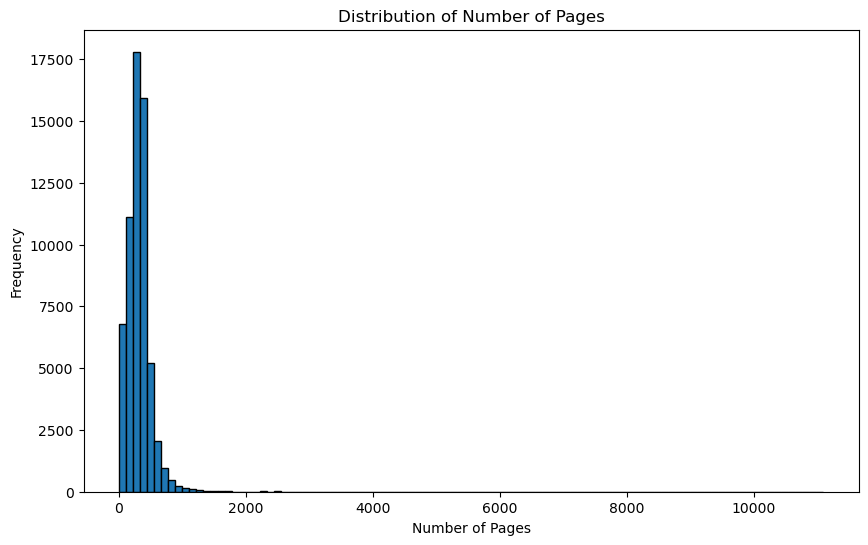

In [ ]:
import matplotlib.pyplot as plt
# Assuming df_embeddings is your DataFrame containing the 'num_pages' column

# Get basic statistics
min_pages = df_embeddings['num_pages'].min()
max_pages = df_embeddings['num_pages'].max()
mean_pages = df_embeddings['num_pages'].mean()
median_pages = df_embeddings['num_pages'].median()

print(f"Minimum number of pages: {min_pages}")
print(f"Maximum number of pages: {max_pages}")
print(f"Mean number of pages: {mean_pages:.2f}")
print(f"Median number of pages: {median_pages}")

# Get distribution information
percentiles = df_embeddings['num_pages'].quantile([0.25, 0.5, 0.75])
print("\nPercentiles:")
print(percentiles)

# Visualize the distribution
plt.figure(figsize=(10, 6))
plt.hist(df_embeddings['num_pages'], bins=100, edgecolor='black')
plt.title('Distribution of Number of Pages')
plt.xlabel('Number of Pages')
plt.ylabel('Frequency')
plt.show()

In [ ]:
categories = {
    'pages<100': lambda x: x < 100,
    '100<pages<200': lambda x: 100 <= x < 200,
    '200<pages<300': lambda x: 200 <= x < 300,
    '300<pages<400': lambda x: 300 <= x < 400,
    '400<pages<500': lambda x: 400 <= x < 500,
    '500<pages': lambda x: x >= 500
}

for category, condition in categories.items():
    df_embeddings[category] = df_embeddings['num_pages'].apply(lambda x: 1 if condition(x) else 0 if pd.notna(x) else None)

most_common_category = df_embeddings[['pages<100', '100<pages<200', '200<pages<300', '300<pages<400', '400<pages<500', '500<pages']].sum().idxmax()

for category in ['pages<100', '100<pages<200', '200<pages<300', '300<pages<400', '400<pages<500', '500<pages']:
    df_embeddings.loc[df_embeddings['num_pages'].isna(), category] = 1 if category == most_common_category else 0

df_embeddings

,text_reviews_count,country_code,language_code,is_ebook,average_rating,similar_books,description,format,authors,publisher,...,bert_embeddings,cluster,cluster_avg_rating,rating_diff_from_cluster_avg,pages<100,100<pages<200,200<pages<300,300<pages<400,400<pages<500,500<pages
0,6,US,,false,4.22,"[948696, 439885, 274955, 12978730, 372986, 216...","To Kara's astonishment, she discovers that a p...",Paperback,"[{'author_id': '19158', 'role': ''}]",Seven Seas,...,"[[-0.3163238466, -0.1351991743, 0.3966403306, ...",1,3.961771,0.258229,0.0,0.0,1.0,0.0,0.0,0.0
1,60,US,eng,true,4.33,[],,,"[{'author_id': '242185', 'role': ''}]",,...,"[[-0.009229064, -0.2218613625, -0.3448269069, ...",2,3.930682,0.399318,0.0,0.0,0.0,1.0,0.0,0.0
2,21,US,en-US,true,4.23,"[25515353, 20483269, 25650829, 18913492, 22578...",,,"[{'author_id': '5360266', 'role': ''}]",,...,"[[-0.009229064, -0.2218613625, -0.3448269069, ...",2,3.930682,0.299318,0.0,0.0,0.0,1.0,0.0,0.0
3,27,US,en-GB,true,4.31,[],"In the Finding Fatherhood series, these shifte...",,"[{'author_id': '90411', 'role': ''}, {'author_...",,...,"[[-0.1072573513, 0.0406609438, 0.1852903962, -...",0,3.905593,0.404407,0.0,0.0,0.0,1.0,0.0,0.0
4,17,US,,true,3.80,"[15728807, 17182499, 15673520, 16081758, 17842...",Wanted by no one.\nHunted by everyone.\nSixtee...,ebook,"[{'author_id': '7314532', 'role': ''}]",Viking Children's,...,"[[-0.0677505285, 0.1621046364, 0.3681726754, -...",11,3.986823,-0.186823,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81862,20,US,eng,true,3.90,"[17704524, 15789985, 13586167, 11991631, 10273...",From New York Timesbestselling author James Ro...,Kindle Edition,"[{'author_id': '38809', 'role': ''}, {'author_...",William Morrow,...,"[[0.0561954342, 0.0816478506, 0.3110363483, -0...",5,3.880758,0.019242,1.0,0.0,0.0,0.0,0.0,0.0
81863,4,US,eng,false,4.22,[],For those previously introduced to the mysteri...,Paperback,"[{'author_id': '6552446', 'role': ''}]",Cerulean Books,...,"[[-0.2123090178, 0.1204471961, 0.3993432224, -...",7,3.967897,0.252103,1.0,0.0,0.0,0.0,0.0,0.0
81864,22,US,,true,3.96,"[13505327, 1752135, 12591482, 18770492, 133591...",Detective Paige Whiskey comes from a long line...,,"[{'author_id': '5234671', 'role': ''}, {'autho...",,...,"[[0.0755813047, -0.0064128255, 0.1759820431, -...",4,3.930838,0.029162,0.0,0.0,0.0,1.0,0.0,0.0
81865,13,US,,false,4.29,"[7552359, 7493149, 9762805, 8409657, 3049514, ...","""A perfect reminder to always be on the lookou...",Hardcover,"[{'author_id': '1221698', 'role': ''}, {'autho...",HarperCollins,...,"[[-0.0915082768, 0.1115334556, 0.4982256889, 0...",5,3.880758,0.409242,1.0,0.0,0.0,0.0,0.0,0.0


## E-books

In [ ]:
df_embeddings['is_ebook'] = (df_embeddings['is_ebook'].str.lower() == 'true').astype(int)
df_embeddings

,text_reviews_count,country_code,language_code,is_ebook,average_rating,similar_books,description,format,authors,publisher,...,bert_embeddings,cluster,cluster_avg_rating,rating_diff_from_cluster_avg,pages<100,100<pages<200,200<pages<300,300<pages<400,400<pages<500,500<pages
0,6,US,,0,4.22,"[948696, 439885, 274955, 12978730, 372986, 216...","To Kara's astonishment, she discovers that a p...",Paperback,"[{'author_id': '19158', 'role': ''}]",Seven Seas,...,"[[-0.3163238466, -0.1351991743, 0.3966403306, ...",1,3.961771,0.258229,0.0,0.0,1.0,0.0,0.0,0.0
1,60,US,eng,1,4.33,[],,,"[{'author_id': '242185', 'role': ''}]",,...,"[[-0.009229064, -0.2218613625, -0.3448269069, ...",2,3.930682,0.399318,0.0,0.0,0.0,1.0,0.0,0.0
2,21,US,en-US,1,4.23,"[25515353, 20483269, 25650829, 18913492, 22578...",,,"[{'author_id': '5360266', 'role': ''}]",,...,"[[-0.009229064, -0.2218613625, -0.3448269069, ...",2,3.930682,0.299318,0.0,0.0,0.0,1.0,0.0,0.0
3,27,US,en-GB,1,4.31,[],"In the Finding Fatherhood series, these shifte...",,"[{'author_id': '90411', 'role': ''}, {'author_...",,...,"[[-0.1072573513, 0.0406609438, 0.1852903962, -...",0,3.905593,0.404407,0.0,0.0,0.0,1.0,0.0,0.0
4,17,US,,1,3.80,"[15728807, 17182499, 15673520, 16081758, 17842...",Wanted by no one.\nHunted by everyone.\nSixtee...,ebook,"[{'author_id': '7314532', 'role': ''}]",Viking Children's,...,"[[-0.0677505285, 0.1621046364, 0.3681726754, -...",11,3.986823,-0.186823,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81862,20,US,eng,1,3.90,"[17704524, 15789985, 13586167, 11991631, 10273...",From New York Timesbestselling author James Ro...,Kindle Edition,"[{'author_id': '38809', 'role': ''}, {'author_...",William Morrow,...,"[[0.0561954342, 0.0816478506, 0.3110363483, -0...",5,3.880758,0.019242,1.0,0.0,0.0,0.0,0.0,0.0
81863,4,US,eng,0,4.22,[],For those previously introduced to the mysteri...,Paperback,"[{'author_id': '6552446', 'role': ''}]",Cerulean Books,...,"[[-0.2123090178, 0.1204471961, 0.3993432224, -...",7,3.967897,0.252103,1.0,0.0,0.0,0.0,0.0,0.0
81864,22,US,,1,3.96,"[13505327, 1752135, 12591482, 18770492, 133591...",Detective Paige Whiskey comes from a long line...,,"[{'author_id': '5234671', 'role': ''}, {'autho...",,...,"[[0.0755813047, -0.0064128255, 0.1759820431, -...",4,3.930838,0.029162,0.0,0.0,0.0,1.0,0.0,0.0
81865,13,US,,0,4.29,"[7552359, 7493149, 9762805, 8409657, 3049514, ...","""A perfect reminder to always be on the lookou...",Hardcover,"[{'author_id': '1221698', 'role': ''}, {'autho...",HarperCollins,...,"[[-0.0915082768, 0.1115334556, 0.4982256889, 0...",5,3.880758,0.409242,1.0,0.0,0.0,0.0,0.0,0.0


## Recreate model

In [ ]:
# Recreate book embeddings with all the necessary features
columns_to_add = ['pages<100', '100<pages<200', '200<pages<300', '300<pages<400', '400<pages<500', '500<pages', 'is_ebook']
result_df = result_df.merge(df_embeddings[['book_id'] + columns_to_add], on='book_id', how='left')

book_embeddings = dict(zip(result_df['book_id'], result_df.iloc[:, 1:].values))

def create_user_profiles(user_data, book_embeddings):
    # Initialize user_profiles with a default value based on the first embedding in book_embeddings
    user_profiles = defaultdict(lambda: np.zeros_like(next(iter(book_embeddings.values()))))
    user_rating_counts = defaultdict(int)

    for user_id, book_id, rating in user_data:
        # Check if the book_id exists in book_embeddings to avoid KeyError
        if book_id in book_embeddings:
            user_profiles[user_id] += rating * book_embeddings[book_id]
            user_rating_counts[user_id] += 1
        else:
            print(f"Warning: Book ID {book_id} not found in embeddings")

    # Normalize the profiles by dividing by the total count of ratings for each user
    for user_id in user_profiles:
        if user_rating_counts[user_id] > 0:  # Avoid division by zero
            user_profiles[user_id] /= user_rating_counts[user_id]

    return user_profiles

# Assuming user_data_list is a list of (user_id, book_id, rating) tuples
# and book_embeddings is a dictionary where book_embeddings[book_id] gives the embedding
user_profiles = create_user_profiles(user_data_list, book_embeddings)

In [ ]:
data_to_predict = df_reviews_test
user_ids_eval = data_to_predict['user_id'].values
book_ids_eval = data_to_predict['book_id'].values


predicted_ratings = model.predict(user_ids_eval, book_ids_eval, user_profiles, book_embeddings)
data_to_predict['predicted_rating'] = predicted_ratings

# Calculate RMSE
rmse = np.sqrt(((data_to_predict['rating'] - data_to_predict['predicted_rating']) ** 2).mean())

print(f"Root Mean Square Error (RMSE): {rmse:.4f}")

791/791 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Root Mean Square Error (RMSE): 1.1167


# Combining models

## Gathering data from both models

In [ ]:
# import data from collaborative filtering model
collab_train = pd.read_csv('thomas_data_train_with_prediction.csv')
collab_test = pd.read_csv('thomas_data_test_with_prediction.csv')
collab_train = collab_train[['user_id', 'book_id', 'old_rating', 'prediction']].rename(columns={'old_rating': 'rating'})
collab_test = collab_test[['user_id', 'book_id', 'old_rating', 'prediction']].rename(columns={'old_rating': 'rating'})


# Convert 'book_id' to string (object)
collab_train['book_id'] = collab_train['book_id'].astype(str)
collab_test['book_id'] = collab_test['book_id'].astype(str)
# merge model prediction
train_data = pd.merge(collab_train, evaluation_dataset[['user_id', 'book_id', 'predicted_rating']], on=['user_id', 'book_id'])

# prepare inputs for the fusion model
X1_train = train_data['prediction'].values.reshape(-1, 1)  # Predictions from the collaborative filtering model
X2_train = train_data['predicted_rating'].values.reshape(-1, 1)  # Predictions from the content-based model
y_train = train_data['rating'].values  # True ratings

In [ ]:
# prepare new covariates to be used
covariates = df_embeddings[['book_id', 'average_rating', 'ratings_count']].set_index('book_id')
covariates_dict = covariates.to_dict('index')

## Training fusion model

In [ ]:
def create_combined_model():
    # Input layers for the two model outputs
    input1 = Input(shape=(1,), name='model1_input')
    input2 = Input(shape=(1,), name='model2_input')

    # Concatenate the inputs
    combined = Concatenate()([input1, input2])

    # Hidden layer
    hidden = Dense(2, activation='linear', name='rating')(combined)

    # Output layer
    output = Dense(1, activation='linear', name='rating')(hidden)

    # Create the model
    model = Model(inputs=[input1, input2], outputs=output)

    # Compile the model
    model.compile(optimizer='adam', loss='mse')

    return model

# Create the model
combined_model = create_combined_model()

# Train the model
history = combined_model.fit([X1_train, X2_train], y_train, epochs=12, batch_size=32, validation_split=0.2)


Epoch 1/12
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 3.9404 - val_loss: 1.1646
Epoch 2/12
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 0.9214 - val_loss: 0.7495
Epoch 3/12
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 0.6524 - val_loss: 0.6874
Epoch 4/12
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 0.6345 - val_loss: 0.6853
Epoch 5/12
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.6262 - val_loss: 0.6870
Epoch 6/12
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 0.6306 - val_loss: 0.6847
Epoch 7/12
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 13s 5ms/step - loss: 0.6229 - val_loss: 0.6848
Epoch 8/12
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 12s 5ms/step - loss: 0.6273 - val_loss: 0.6866
Epoch 9/12
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 0.6283 - val_loss: 0.6863
Epoch 10/12
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 0.6439 - val_loss: 0.6864
Epoch 11/12
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 0.6216 - val_loss: 0.6869
Epoch 12/12
2500/250

In [ ]:
# Make predictions
predictions = combined_model.predict([X1_train, X2_train])

# Calculate RMSE
rmse = np.sqrt(((predictions - y_train) ** 2).mean())

3125/3125 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step


In [ ]:
rmse

0.7988236765682623

## Predictions on test data

In [ ]:
# Merge test data from both models
test_data = pd.merge(collab_test, evaluation_dataset_test[['user_id', 'book_id', 'predicted_rating']], on=['user_id', 'book_id'])

# Prepare inputs for the combined model
X1_test = test_data['prediction'].values.reshape(-1, 1)  # Predictions from collaborative filtering model
X2_test = test_data['predicted_rating'].values.reshape(-1, 1)  # Predictions from content-based model
y_test = test_data['rating'].values  # True ratings

In [ ]:
# Make predictions
predictions_test = combined_model.predict([X1_test, X2_test])

# Calculate RMSE
rmse_test = np.sqrt(((predictions_test - y_test) ** 2).mean())

660/660 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


In [ ]:
rmse_test

1.6112170072904408

## Last attempt

In [ ]:
X2_train = evaluation_dataset[['user_id', 'book_id', 'predicted_rating']]

In [ ]:
X2_test = evaluation_dataset_test[['user_id', 'book_id', 'predicted_rating']]

In [ ]:
covariates_df = pd.DataFrame.from_dict(covariates_dict, orient='index').reset_index()
covariates_df.columns = ['book_id', 'average_rating', 'ratings_count']

merged_df = pd.merge(X2_train, covariates_df, on='book_id', how='left')
# Force all columns to be numeric
for col in ['predicted_rating', 'average_rating', 'ratings_count']:
    merged_df[col] = pd.to_numeric(merged_df[col], errors='coerce')

X_combined = merged_df[['predicted_rating', 'average_rating', 'ratings_count']].values
y = evaluation_dataset['rating'].values

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

model = Sequential([
    Dense(8, activation='relu', input_shape=(3,)),
    Dense(4, activation='relu'),
    Dense(1)
])

model.compile(optimizer='adam', loss='mse')

history = model.fit(X_combined, y, epochs=20, batch_size=32, validation_split=0.2)

Epoch 1/20


c:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12016/12016 ━━━━━━━━━━━━━━━━━━━━ 20s 2ms/step - loss: 716768192.0000 - val_loss: 14.8064
Epoch 2/20
12016/12016 ━━━━━━━━━━━━━━━━━━━━ 21s 2ms/step - loss: 3992.8469 - val_loss: 4.3661
Epoch 3/20
12016/12016 ━━━━━━━━━━━━━━━━━━━━ 21s 2ms/step - loss: 4.6320 - val_loss: 1.6308
Epoch 4/20
12016/12016 ━━━━━━━━━━━━━━━━━━━━ 20s 2ms/step - loss: 1.6157 - val_loss: 1.6305
Epoch 5/20
12016/12016 ━━━━━━━━━━━━━━━━━━━━ 19s 2ms/step - loss: 1.6219 - val_loss: 1.6312
Epoch 6/20
12016/12016 ━━━━━━━━━━━━━━━━━━━━ 20s 2ms/step - loss: 1.6359 - val_loss: 1.6301
Epoch 7/20
12016/12016 ━━━━━━━━━━━━━━━━━━━━ 20s 2ms/step - loss: 21.7454 - val_loss: 1.6302
Epoch 8/20
12016/12016 ━━━━━━━━━━━━━━━━━━━━ 29s 2ms/step - loss: 1.6243 - val_loss: 1.6297
Epoch 9/20
12016/12016 ━━━━━━━━━━━━━━━━━━━━ 28s 2ms/step - loss: 1.6225 - val_loss: 1.6224
Epoch 10/20
12016/12016 ━━━━━━━━━━━━━━━━━━━━ 21s 2ms/step - loss: 1.6160 - val_loss: 1.6162
Epoch 11/20
12016/12016 ━━━━━━━━━━━━━━━━━━━━ 19s 2ms/step - loss: 58.3650 - val_loss: 1

In [ ]:
# Make predictions
predictions_train = model.predict([X_combined])

# Calculate RMSE
rmse = np.sqrt(((predictions_train - y) ** 2).mean())
rmse

1.2696057776775782

In [ ]:
y = y.reshape(-1,1)

In [ ]:
merged_df_test = pd.merge(X2_test, covariates_df, on='book_id', how='left')
# Force all columns to be numeric
for col in ['predicted_rating', 'average_rating', 'ratings_count']:
    merged_df_test[col] = pd.to_numeric(merged_df_test[col], errors='coerce')

X_combined_test = merged_df_test[['predicted_rating', 'average_rating', 'ratings_count']].values
y_test = evaluation_dataset_test['rating'].values

In [ ]:
# Make predictions
predictions_test = model.predict([X_combined_test])



791/791 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


In [ ]:
y_test = y_test.reshape(-1,1)

In [ ]:
# Calculate RMSE
rmse_test = np.sqrt(((predictions_test - y_test) ** 2).mean())
rmse_test

1.2603534357123214

In [ ]:
first_value_size = len(next(iter(book_embeddings.values())))
first_value_size

768